# Wildfire Prediction Challenge
Can you predict the burned area of wildfires in Zimbabwe?

Each year, thousands of fires blaze across the African continent. Some are natural occurrences, part of a ‘fire cycle’ that can actually benefit some dryland ecosystems. Many are started intentionally, used to clear land or to prepare fields for planting. And some are wildfires, which can rage over large areas and cause huge amounts of damage. Whatever the cause, fires pour vast amounts of CO2 into the atmosphere, along with smoke that degrades air quality for those living downwind.

Figuring out the dynamics that influence where and when these fires occur can help us to better understand their effects. And predicting how these dynamics will play out in the future, under different climatic conditions, could prove extremely useful.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import csv
import os
import warnings
import folium as fl

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

from prophet import Prophet
from geopy.geocoders import Nominatim
from geopy.point import Point

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 1000)

sb.set_style('darkgrid')

warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv(r'Train.csv')
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation
0,0_2001-01-01,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932
1,1_2001-01-01,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093
2,2_2001-01-01,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109
3,3_2001-01-01,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418
4,4_2001-01-01,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621


### Statistical representation

In [3]:
df.shape

(83148, 29)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83148 entries, 0 to 83147
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             83148 non-null  object 
 1   lat            83148 non-null  float64
 2   lon            83148 non-null  float64
 3   burn_area      83148 non-null  float64
 4   climate_aet    83148 non-null  int64  
 5   climate_def    83148 non-null  int64  
 6   climate_pdsi   83148 non-null  int64  
 7   climate_pet    83148 non-null  int64  
 8   climate_pr     83148 non-null  int64  
 9   climate_ro     83148 non-null  int64  
 10  climate_soil   83148 non-null  int64  
 11  climate_srad   83148 non-null  int64  
 12  climate_swe    83148 non-null  int64  
 13  climate_tmmn   83148 non-null  int64  
 14  climate_tmmx   83148 non-null  int64  
 15  climate_vap    83148 non-null  int64  
 16  climate_vpd    83148 non-null  int64  
 17  climate_vs     83148 non-null  int64  
 18  elevat

In [5]:
df.isnull().sum()

ID               0
lat              0
lon              0
burn_area        0
climate_aet      0
climate_def      0
climate_pdsi     0
climate_pet      0
climate_pr       0
climate_ro       0
climate_soil     0
climate_srad     0
climate_swe      0
climate_tmmn     0
climate_tmmx     0
climate_vap      0
climate_vpd      0
climate_vs       0
elevation        0
landcover_0      0
landcover_1      0
landcover_2      0
landcover_3      0
landcover_4      0
landcover_5      0
landcover_6      0
landcover_7      0
landcover_8      0
precipitation    0
dtype: int64

In [6]:
def eliminate_object_series(df):
    numerals = []
    category = df.select_dtypes(include=['int64', 'float64'])
    for i in category:
        numerals.append(i)
    plt.figure(figsize=(20, 10))
    plt.title('Pearsons Correlation of Columns', fontdict={'size':15})
    return sb.heatmap(df[numerals].corr(), annot=True, linewidths=0.5)
    

<Axes: title={'center': 'Pearsons Correlation of Columns'}>

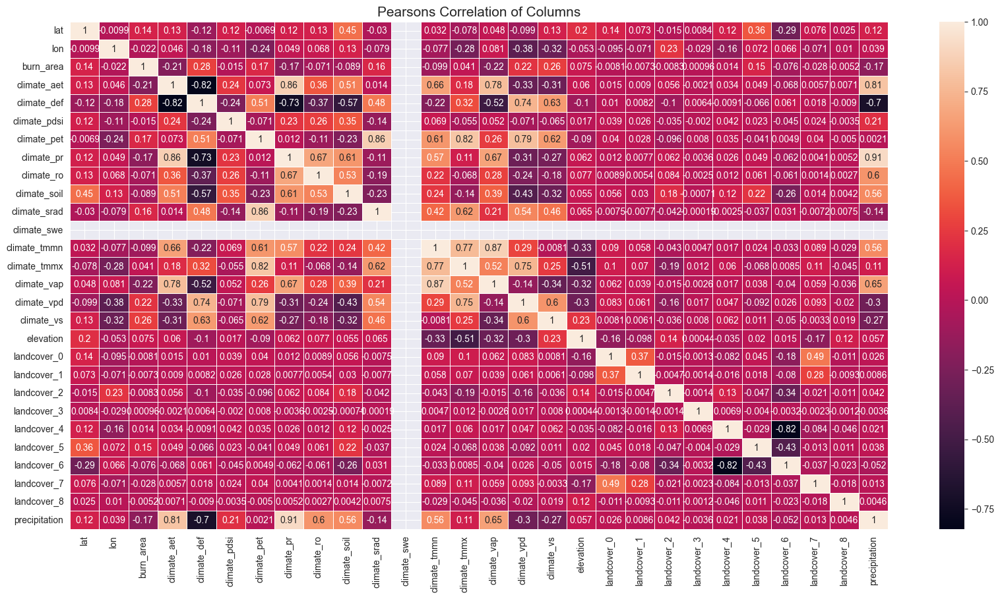

In [7]:
eliminate_object_series(df)

<Axes: title={'center': 'Burn area Correlation Coeffecients with other column series'}>

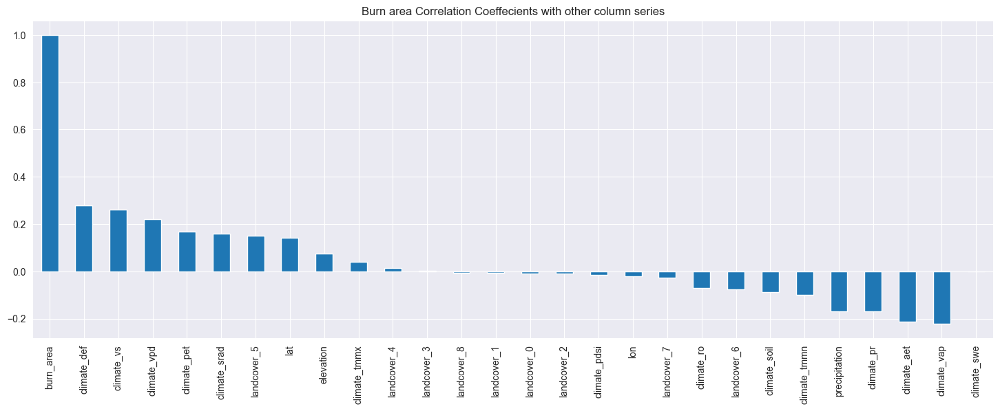

In [8]:
df.select_dtypes(include=['number']).corr()['burn_area'].sort_values(ascending=False).plot(kind='bar', figsize=(18, 6), title='Burn area Correlation Coeffecients with other column series')

In [9]:
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation
0,0_2001-01-01,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932
1,1_2001-01-01,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093
2,2_2001-01-01,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109
3,3_2001-01-01,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418
4,4_2001-01-01,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621


<Axes: title={'center': 'Distribution of Burnt areas in Zimbabwe'}, xlabel='burn_area', ylabel='Density'>

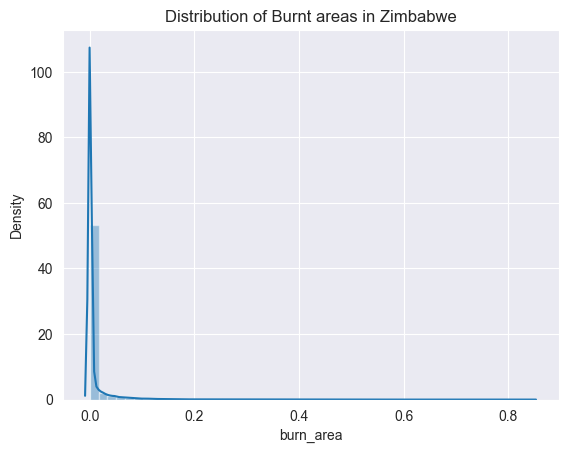

In [10]:
plt.title('Distribution of Burnt areas in Zimbabwe')
sb.distplot(df['burn_area'])

<Axes: title={'center': 'Distribution of wildfire Precipitation in Zimbabwe'}, xlabel='precipitation', ylabel='Density'>

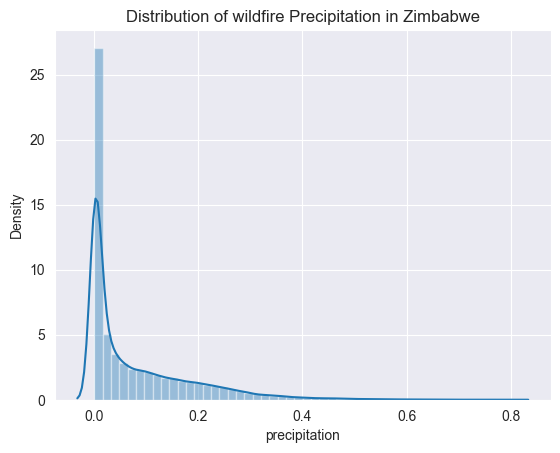

In [11]:
plt.title('Distribution of wildfire Precipitation in Zimbabwe')
sb.distplot(df['precipitation'])

In [12]:
round(df.describe(),2)

,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation
count,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.0,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00,83148.0,83148.00,83148.0,83148.00,83148.00,83148.00,83148.00,83148.00,83148.00
mean,-19.01,29.86,0.01,484.49,828.89,-30.81,1313.38,54.58,6.22,305.48,2281.97,0.0,140.83,285.29,1554.53,127.38,208.41,978.99,0.01,0.0,0.01,0.0,0.16,0.04,0.79,0.00,0.00,0.08
std,1.59,1.75,0.03,470.47,546.93,235.80,315.21,72.00,21.48,400.96,333.05,0.0,44.63,34.84,458.46,44.17,47.55,297.50,0.05,0.0,0.06,0.0,0.19,0.11,0.23,0.00,0.01,0.10
min,-22.36,25.49,0.00,0.00,0.00,-563.00,587.00,0.00,0.00,1.00,1167.00,0.0,19.00,139.00,704.00,32.00,48.00,265.38,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00
25%,-20.36,28.49,0.00,50.00,375.00,-212.00,1081.00,1.00,0.00,70.00,2028.00,0.0,103.00,262.00,1139.00,97.00,174.00,768.38,0.00,0.0,0.00,0.0,0.01,0.00,0.66,0.00,0.00,0.00
50%,-18.86,29.99,0.00,302.00,858.00,-108.00,1290.00,22.00,1.00,149.00,2272.00,0.0,150.00,287.00,1544.00,118.00,205.00,1022.81,0.00,0.0,0.00,0.0,0.08,0.00,0.88,0.00,0.00,0.03
75%,-17.86,31.24,0.00,931.00,1211.00,142.00,1517.00,87.00,4.00,329.00,2545.00,0.0,177.00,310.00,1942.00,149.00,241.00,1197.98,0.00,0.0,0.00,0.0,0.25,0.02,0.97,0.00,0.00,0.13
max,-15.86,32.99,0.84,1713.00,2614.00,851.00,2620.00,501.00,342.00,3319.00,3170.00,0.0,244.00,400.00,2786.00,344.00,393.00,1771.93,0.83,0.0,0.71,0.0,0.98,0.88,1.00,0.02,0.30,0.80


<Axes: title={'center': 'Wildfire against distance above sea level'}, xlabel='elevation', ylabel='burn_area'>

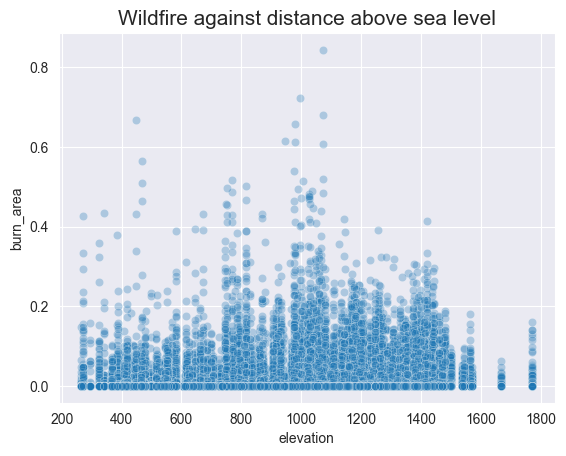

In [13]:
plt.title('Wildfire against distance above sea level', fontdict={'size':15})
sb.scatterplot(df, y=df['burn_area'], x=df['elevation'], alpha=0.3)

<Axes: title={'center': "Frozen water in the atmospheres' \neffect on wildfires"}, xlabel='precipitation', ylabel='burn_area'>

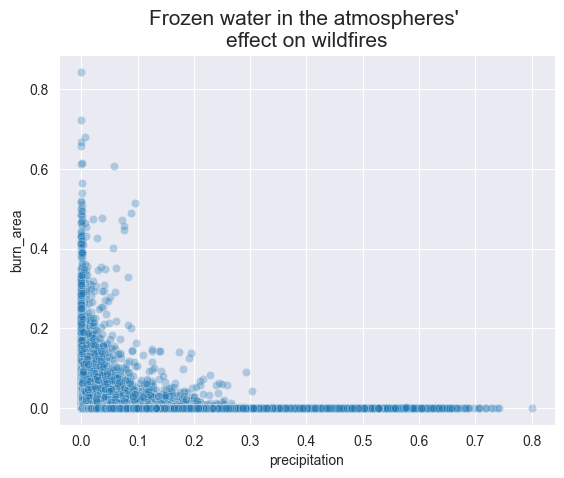

In [14]:
plt.title("Frozen water in the atmospheres' \neffect on wildfires", fontdict={'size':15})
sb.scatterplot(df, x=df['precipitation'], y=df['burn_area'], alpha=0.3)

Mean Longitude in Zimbabwe: 29.860856392120077


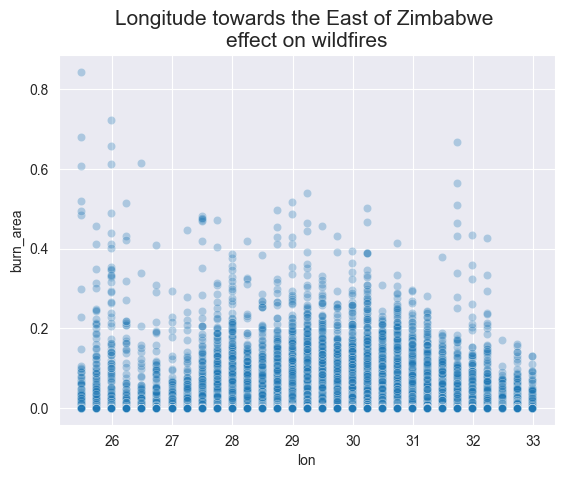

In [15]:
plt.title("Longitude towards the East of Zimbabwe \neffect on wildfires", fontdict={'size':15})
sb.scatterplot(df, x=df['lon'], y=df['burn_area'], alpha=0.3)
print(f'Mean Longitude in Zimbabwe: {df["lon"].mean()}')

Mean Latitude in Zimbabwe: -19.014557326453918


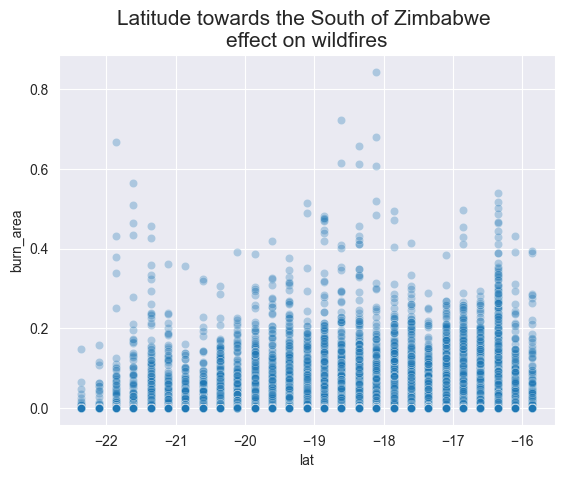

In [16]:
plt.title("Latitude towards the South of Zimbabwe \neffect on wildfires", fontdict={'size':15})
sb.scatterplot(df, x=df['lat'], y=df['burn_area'], alpha=0.3)
print(f'Mean Latitude in Zimbabwe: {df["lat"].mean()}')

<Axes: title={'center': 'Coordinates vs Wildfire in Zimbabwe'}>

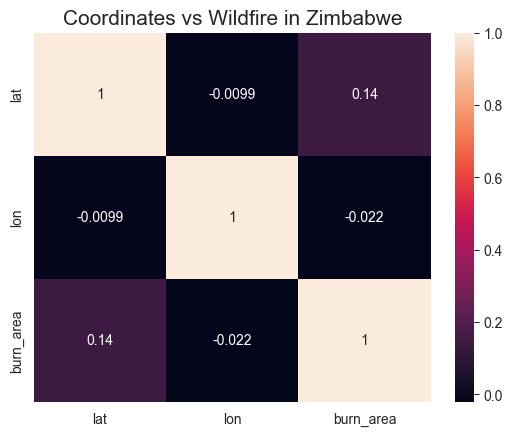

In [17]:
plt.title('Coordinates vs Wildfire in Zimbabwe', fontdict={'size':15})
coords = ['lat', 'lon', 'burn_area']
sb.heatmap(df[coords].corr(), annot=True)

Suprisingly we note that theres a negative similarity in coefficients of coordinates to the cause of wildfires in Zimbabwe

### Data Cleaning and Manipulation

In [18]:
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation
0,0_2001-01-01,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932
1,1_2001-01-01,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093
2,2_2001-01-01,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109
3,3_2001-01-01,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418
4,4_2001-01-01,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621


In [19]:
df['ID'].dtype

dtype('O')

In [20]:
df[['ID', 'date']] = df['ID'].str.split('_', expand=True)

In [21]:
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation,date
0,0,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932,2001-01-01
1,1,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093,2001-01-01
2,2,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109,2001-01-01
3,3,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418,2001-01-01
4,4,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621,2001-01-01


In [22]:
df['date'] = pd.to_datetime(df['date'])

In [23]:
df['date'].dtype

dtype('<M8[ns]')

In [24]:
df['month_num'] = df['date'].dt.month
df['month_name'] = df['date'].dt.month_name()
df['year'] = df['date'].dt.year
df['day_name'] = df['date'].dt.day_name()
df['day'] = df['date'].dt.day

In [25]:
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation,date,month_num,month_name,year,day_name,day
0,0,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932,2001-01-01,1,January,2001,Monday,1
1,1,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093,2001-01-01,1,January,2001,Monday,1
2,2,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109,2001-01-01,1,January,2001,Monday,1
3,3,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418,2001-01-01,1,January,2001,Monday,1
4,4,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621,2001-01-01,1,January,2001,Monday,1


In [26]:
df['day'].value_counts()

day
1    83148
Name: count, dtype: int64

<Axes: title={'center': 'Monthly wildfire occurences in Zimbabwe'}, xlabel='month_name,month_num'>

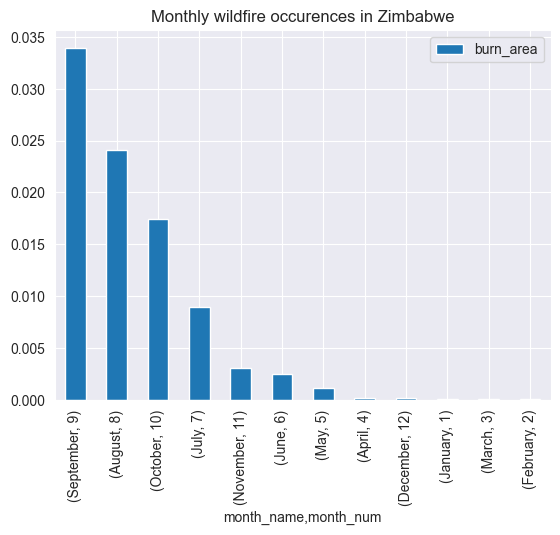

In [27]:
mean_group_by_month = df.groupby(['month_name', 'month_num'])['burn_area']
mean_group_by_month.mean().sort_values(ascending=False).to_frame().plot(kind='bar', title ='Monthly wildfire occurences in Zimbabwe')

<Axes: title={'center': 'Yearly wildfire occurence in Zimbabwe'}, xlabel='year', ylabel='burn_area'>

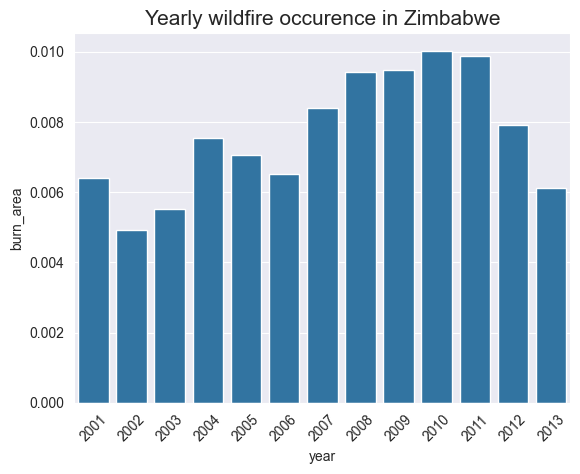

In [28]:
yearly_group = df.groupby('year')['burn_area']
plt.title('Yearly wildfire occurence in Zimbabwe', fontdict={'size':15})
plt.xticks(rotation=45)
yearly_mean = yearly_group.mean().sort_values(ascending=True)
sb.barplot(x=yearly_mean.index, y=yearly_mean)

Text(0.5, 0, 'month')

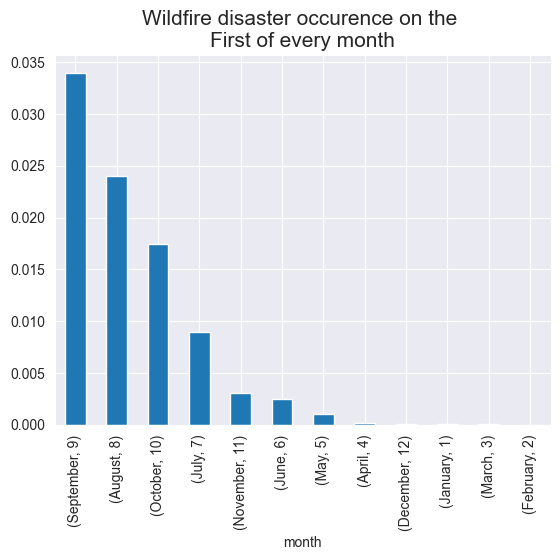

In [29]:
daily_mean = df.groupby('day').get_group(1)
monthly_group_mean = daily_mean.groupby(['month_name', 'month_num'])['burn_area']
plt.title('Wildfire disaster occurence on the \nFirst of every month', fontdict={'size':15})
monthly_group_mean.mean().sort_values(ascending=False).plot(kind='bar')
plt.xlabel('month')

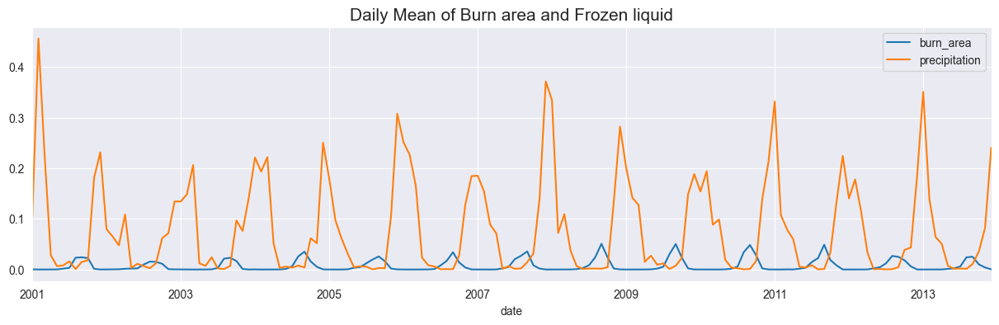

In [30]:
plt.figure(figsize=(15, 4))
plt.title('Daily Mean of Burn area and Frozen liquid', fontdict={'size':15})
df.groupby('date')['burn_area'].mean().plot()
df.groupby('date')['precipitation'].mean().plot()
plt.legend(loc='best')

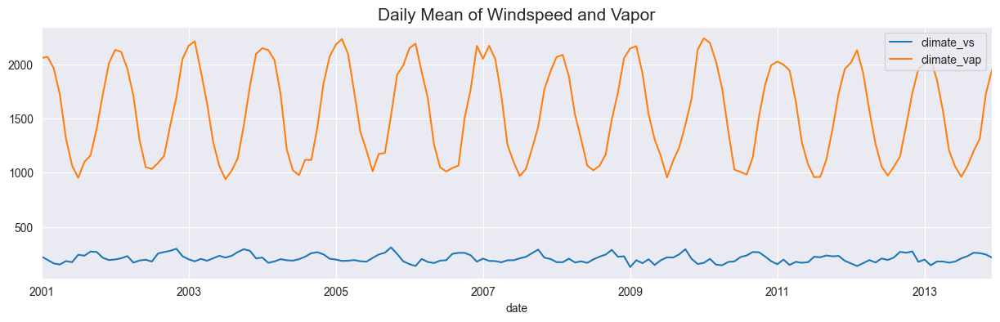

In [31]:
plt.figure(figsize=(15, 4))
plt.title('Daily Mean of Windspeed and Vapor', fontdict={'size':15})
df.groupby('date')['climate_vs'].mean().plot()
df.groupby('date')['climate_vap'].mean().plot()
plt.legend(loc='best')

### Feature Engineering

In [32]:
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation,date,month_num,month_name,year,day_name,day
0,0,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932,2001-01-01,1,January,2001,Monday,1
1,1,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093,2001-01-01,1,January,2001,Monday,1
2,2,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109,2001-01-01,1,January,2001,Monday,1
3,3,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418,2001-01-01,1,January,2001,Monday,1
4,4,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621,2001-01-01,1,January,2001,Monday,1


### Test 1 - Engineering through tirals and errors 
This experiment will exclude Datetime series of the wildfire dataset

In [33]:
x_1 = df.drop(columns=['burn_area', 'date', 'month_num', 'month_name', 'year', 'day_name', 'day'])
y_1 = df['burn_area']

x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(x_1, y_1, test_size=0.2, random_state=42)

print(f'x train: {x_train_1.shape} \nx test: {x_test_1.shape}')
print(f'y train: {x_train_1.shape} \ny test: {x_test_1.shape}')

x train: (66518, 28) 
x test: (16630, 28)
y train: (66518, 28) 
y test: (16630, 28)


In [34]:
def model_eval(models):

    for model in models.values():
    
        model.fit(x_train_1, y_train_1)
    
        prediction_1 = model.predict(x_test_1)
    
        print(f'Model Evaluation of {model}')
        print("===========================================")
        print(f'R2 score: {r2_score(prediction_1, y_test_1)}')
        print(f'Mean sq error: {mean_squared_error(prediction_1, y_test_1)}')
        print(f'Mean ab error: {mean_absolute_error(prediction_1, y_test_1)}')
        print(f'Root mean sq error: {mean_squared_error(prediction_1, y_test_1)**0.5}')
        print("")

In [35]:
models = {
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(n_estimators=10),
    'Linear Reg': LinearRegression()
}



In [36]:
model_eval(models)

Model Evaluation of DecisionTreeRegressor()
R2 score: -0.02862294515610153
Mean sq error: 0.0009230884511751222
Mean ab error: 0.008111933430717786
Root mean sq error: 0.030382370729999365

Model Evaluation of RandomForestRegressor(n_estimators=10)
R2 score: -0.13748179200682276
Mean sq error: 0.0005276534929050186
Mean ab error: 0.006847166045832521
Root mean sq error: 0.022970709455848736

Model Evaluation of LinearRegression()
R2 score: -4.24245253848731
Mean sq error: 0.000695064753023749
Mean ab error: 0.0116819742816513
Root mean sq error: 0.026364080735420098



In [37]:
models.values()

dict_values([DecisionTreeRegressor(), RandomForestRegressor(n_estimators=10), LinearRegression()])

In [38]:
0.0009615835516069463 > 0.0004596722649378543 > 0.000695064753023749

False

Based on test 1, we will use the RandomForestRegressor() model since it outperformed all the other models

In [39]:
rfr = RandomForestRegressor(n_estimators=10)

rfr.fit(x_train_1, y_train_1)

rfr_prediction_1 = rfr.predict(x_test_1)

rfr_prediction_1
print(f'R2 score: {r2_score(rfr_prediction_1, y_test_1)}')
print(f'Mean sq error: {mean_squared_error(rfr_prediction_1, y_test_1)}')
print(f'Mean ab error: {mean_absolute_error(rfr_prediction_1, y_test_1)}')
print(f'Root mean sq error: {mean_squared_error(rfr_prediction_1, y_test_1)**0.5}')

R2 score: -0.11072052904166418
Mean sq error: 0.0005090801697900286
Mean ab error: 0.00673697673037197
Root mean sq error: 0.022562805007135717


### Test 2. we will exclude object values inclusive of the datetime series

In [40]:
x_2 = df.drop(columns=['burn_area', 'date', 'month_name', 'day_name'])
y_2 = df['burn_area']

x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(x_2, y_2, test_size=0.2, random_state=42)

In [41]:
def model_eval_test2(models):

    for model in models.values():
    
        model.fit(x_train_2, y_train_2)
    
        prediction_2 = model.predict(x_test_2)
    
        print(f'Model Evaluation of {model}')
        print("===========================================")
        print(f'R2 score: {r2_score(prediction_2, y_test_2)}')
        print(f'Mean sq error: {mean_squared_error(prediction_2, y_test_2)}')
        print(f'Mean ab error: {mean_absolute_error(prediction_2, y_test_2)}')
        print(f'Root mean sq error: {mean_squared_error(prediction_2, y_test_2)**0.5}')
        print("")

In [42]:
model_eval_test2(models)

Model Evaluation of DecisionTreeRegressor()
R2 score: -0.0615920561551333
Mean sq error: 0.001002121263834044
Mean ab error: 0.008175468625732043
Root mean sq error: 0.03165629895982858

Model Evaluation of RandomForestRegressor(n_estimators=10)
R2 score: -0.19648211812014793
Mean sq error: 0.0005156369960414269
Mean ab error: 0.006637643562927304
Root mean sq error: 0.022707641798333594

Model Evaluation of LinearRegression()
R2 score: -4.178893829725223
Mean sq error: 0.0006937754140688288
Mean ab error: 0.011671470906497736
Root mean sq error: 0.02633961681704631



### Test 3. splitting the dataset based on datetime series

In [43]:
x_3 = df[df['date'] < '2011-01-01']
y_3 = df[df['date'] > '2011-01-01']

In [44]:
dependent_var = ['climate_aet', 'climate_def', 'climate_pdsi', 'climate_pet', 'climate_pr', 'climate_ro', 'climate_soil', 'climate_srad', 'climate_swe', 'climate_tmmn',	
'climate_tmmx', 'climate_vap', 'climate_vpd', 'climate_vs', 'elevation', 'landcover_0', 'landcover_1', 'landcover_2', 'landcover_3', 'landcover_4', 'landcover_5', 'landcover_6',	
'landcover_7', 'landcover_8', 'precipitation']

target_var = ['burn_area']



In [45]:
x_train_3, y_train_3 = x_3[dependent_var], x_3[target_var]
x_test_3, y_test_3 = y_3[dependent_var], y_3[target_var]

In [46]:
def model_eval_test3(models):

    for model in models.values():
    
        model.fit(x_train_3, y_train_3)
    
        prediction_3 = model.predict(x_test_3)
    
        print(f'Model Evaluation of {model}')
        print("===========================================")
        print(f'R2 score: {r2_score(prediction_3, y_test_3)}')
        print(f'Mean sq error: {mean_squared_error(prediction_3, y_test_3)}')
        print(f'Mean ab error: {mean_absolute_error(prediction_3, y_test_3)}')
        print(f'Root mean sq error: {mean_squared_error(prediction_3, y_test_3)**0.5}')
        print("")

In [47]:
model_eval_test3(models)

Model Evaluation of DecisionTreeRegressor()
R2 score: -0.004169250164240745
Mean sq error: 0.0018488374180611108
Mean ab error: 0.01276068808426434
Root mean sq error: 0.042998109470779186

Model Evaluation of RandomForestRegressor(n_estimators=10)
R2 score: -0.12810197430354764
Mean sq error: 0.000725028084027116
Mean ab error: 0.00982198795711798
Root mean sq error: 0.02692634553791353

Model Evaluation of LinearRegression()
R2 score: -6.556114490072291
Mean sq error: 0.0007377332654641539
Mean ab error: 0.012689097562322966
Root mean sq error: 0.027161245653764737



### Here’s the evaluation of the 3 tests:

**Test 1:**
- Best Model: RandomForestRegressor
- Best Performance Metric: Mean Squared Error (MSE) = 0.0005169406778676129
  
**Test 2:**
- Best Model: RandomForestRegressor
- Best Performance Metric: Mean Squared Error (MSE) = 0.0005143635768513721
  
**Test 3:**
- Best Model: RandomForestRegressor
- Best Performance Metric: Mean Squared Error (MSE) = 0.0007330460947182798
  
**Overall Best Test**
- Best Performing Test: Test 2 (Lowest MSE = 0.0005143635768513721)
- Best Model in Best Performing Test: RandomForestRegressor
- Test 2 with RandomForestRegressor: RMSE = 0.022679585023791155
  
So, Test 2 with RandomForestRegressor is the best performing combination out of the three tests, with the lowest MSE and lowest RMSE.

### Final Submission 

In [48]:
submission_df = pd.read_csv('..\SampleSubmission.csv')
submission_df.head()

,ID,burn_area
0,0_2014-01-01,0
1,1_2014-01-01,0
2,2_2014-01-01,0
3,3_2014-01-01,0
4,4_2014-01-01,0


In [49]:
wildfire_submission = submission_df.to_csv('wildfire_submission.csv', index=False)

In [50]:
ws = pd.read_csv('wildfire_submission.csv')
ws.head()

,ID,burn_area
0,0_2014-01-01,0
1,1_2014-01-01,0
2,2_2014-01-01,0
3,3_2014-01-01,0
4,4_2014-01-01,0


In [51]:
test = pd.read_csv('Test.csv')
test.head()

,ID,lat,lon,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation
0,0_2014-01-01,-15.858835,29.237029,1146,74,-451,1220,120,6,212,1974,0,217,303,2481,99,148,413.474762,0.0,0.000615,0.015418,0.0,0.416704,0.023724,0.530016,0.013524,0.0,0.404243
1,1_2014-01-01,-15.858835,29.487029,1118,98,-405,1216,117,6,330,1973,0,216,304,2481,100,143,429.034543,0.0,0.000000,0.000000,0.0,0.406436,0.000446,0.593118,0.000000,0.0,0.421489
2,2_2014-01-01,-15.858835,29.737029,1067,137,-468,1204,111,6,194,1958,0,214,302,2465,97,143,477.246432,0.0,0.000000,0.000000,0.0,0.254791,0.000000,0.745209,0.000000,0.0,0.419122
3,3_2014-01-01,-15.858835,29.987029,969,187,-533,1156,101,5,78,1954,0,202,290,2317,88,122,646.388681,0.0,0.000000,0.000000,0.0,0.219340,0.182153,0.598507,0.000000,0.0,0.404596
4,4_2014-01-01,-15.858835,30.237029,927,270,-505,1197,96,5,139,1939,0,210,301,2412,99,143,582.340637,0.0,0.000000,0.000000,0.0,0.220239,0.097748,0.682013,0.000000,0.0,0.371100


In [52]:
# ws.drop(columns=['Unnamed: 0'], inplace=True)

In [53]:
test[['ID', 'date']] = test['ID'].str.split('_', expand=True)
test['date'] = pd.to_datetime(test['date'])

In [54]:
test['month_num'] = test['date'].dt.month
test['year'] = test['date'].dt.year

In [55]:
x = test.drop(columns=['ID', 'lat', 'lon'], inplace=True)
# y = test['burn_area']

# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [56]:
cols = ['climate_aet', 'climate_def',
       'climate_pdsi', 'climate_pet', 'climate_pr', 'climate_ro',
       'climate_soil', 'climate_srad', 'climate_swe', 'climate_tmmn',
       'climate_tmmx', 'climate_vap', 'climate_vpd', 'climate_vs', 'elevation',
       'landcover_0', 'landcover_1', 'landcover_2', 'landcover_3',
       'landcover_4', 'landcover_5', 'landcover_6', 'landcover_7',
       'landcover_8', 'precipitation']

cols2 = df.drop(columns = ['ID', 'lat', 'lon'])

In [57]:
model = RandomForestRegressor(n_estimators=10)
model.fit(x_train_3, y_train_3)
# model.fit(x_train_2, y_train_2)
predictions = model.predict(test[dependent_var].fillna(0))

In [58]:
ws['burn_area'] = predictions

In [59]:
ws['burn_area'] = ws['burn_area'].clip(0,1)

In [60]:
ws.head()

,ID,burn_area
0,0_2014-01-01,0.000000
1,1_2014-01-01,0.000000
2,2_2014-01-01,0.000000
3,3_2014-01-01,0.001428
4,4_2014-01-01,0.000611


<Axes: xlabel='year', ylabel='burn_area'>

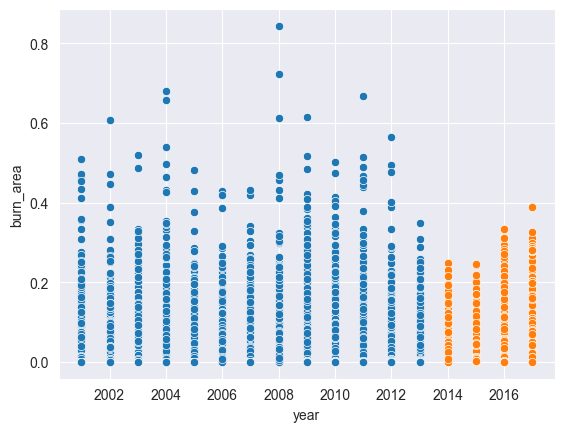

In [61]:
sb.scatterplot(df, y=df['burn_area'], x=df['year'])
sb.scatterplot(test, y=ws['burn_area'], x=test['year'])

### Extras
1. Predict the future of burnt surface size

In [62]:
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation,date,month_num,month_name,year,day_name,day
0,0,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932,2001-01-01,1,January,2001,Monday,1
1,1,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093,2001-01-01,1,January,2001,Monday,1
2,2,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109,2001-01-01,1,January,2001,Monday,1
3,3,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418,2001-01-01,1,January,2001,Monday,1
4,4,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621,2001-01-01,1,January,2001,Monday,1


In [63]:
new_df = pd.DataFrame(df[['date', 'burn_area']])

In [64]:
new_df.head()

,date,burn_area
0,2001-01-01,0.0
1,2001-01-01,0.0
2,2001-01-01,0.0
3,2001-01-01,0.0
4,2001-01-01,0.0


In [65]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83148 entries, 0 to 83147
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       83148 non-null  datetime64[ns]
 1   burn_area  83148 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.3 MB


In [66]:
new_df.rename(columns={ 'date':'ds',
                        'burn_area':'y'
                        }, 
              inplace=True)

In [67]:
new_df.head()

,ds,y
0,2001-01-01,0.0
1,2001-01-01,0.0
2,2001-01-01,0.0
3,2001-01-01,0.0
4,2001-01-01,0.0


In [68]:
model = Prophet()

In [69]:
model.fit(new_df)

15:45:25 - cmdstanpy - INFO - Chain [1] start processing
15:46:02 - cmdstanpy - INFO - Chain [1] done processing


In [70]:
future = model.make_future_dataframe(periods=1460)
forecast = model.predict(future)

In [71]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2001-01-01,0.007228,-0.035125,0.034241,0.007228,0.007228,-0.008091,-0.008091,-0.008091,-0.008091,-0.008091,-0.008091,0.0,0.0,0.0,-0.000862
1,2001-02-01,0.007021,-0.037659,0.031278,0.007021,0.007021,-0.007836,-0.007836,-0.007836,-0.007836,-0.007836,-0.007836,0.0,0.0,0.0,-0.000814
2,2001-03-01,0.006834,-0.035283,0.032883,0.006834,0.006834,-0.007658,-0.007658,-0.007658,-0.007658,-0.007658,-0.007658,0.0,0.0,0.0,-0.000823
3,2001-04-01,0.006627,-0.034654,0.034331,0.006627,0.006627,-0.007411,-0.007411,-0.007411,-0.007411,-0.007411,-0.007411,0.0,0.0,0.0,-0.000784
4,2001-05-01,0.006427,-0.033852,0.034049,0.006427,0.006427,-0.006527,-0.006527,-0.006527,-0.006527,-0.006527,-0.006527,0.0,0.0,0.0,-0.000100


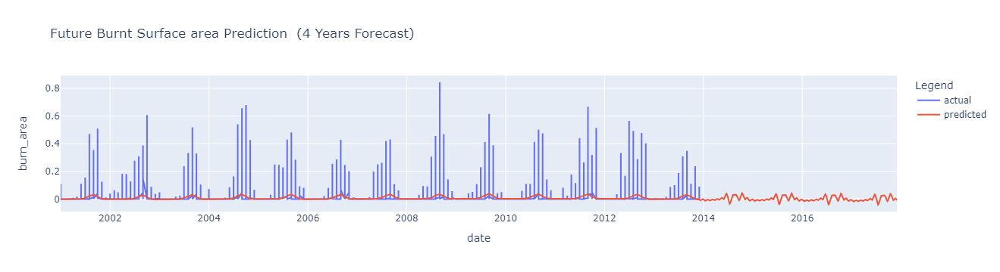

In [72]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=new_df['ds'], y=new_df['y'], mode='lines', name='actual'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='predicted'))
fig.update_layout(
	    title=f'Future Burnt Surface area Prediction \n(4 Years Forecast)',
	    xaxis_title='date',
	    yaxis_title='burn_area',
	    legend_title='Legend'
	)
fig.show()

2. Map the burnt surface areas in Zimbabwe

In [73]:
df.head()

,ID,lat,lon,burn_area,climate_aet,climate_def,climate_pdsi,climate_pet,climate_pr,climate_ro,climate_soil,climate_srad,climate_swe,climate_tmmn,climate_tmmx,climate_vap,climate_vpd,climate_vs,elevation,landcover_0,landcover_1,landcover_2,landcover_3,landcover_4,landcover_5,landcover_6,landcover_7,landcover_8,precipitation,date,month_num,month_name,year,day_name,day
0,0,-15.858835,29.237029,0.0,1195,0,263,1195,206,10,1692,1861,0,211,317,2493,111,141,413.474762,0.0,0.0,0.018654,0.0,0.714446,0.012174,0.244890,0.009836,0.0,0.256932,2001-01-01,1,January,2001,Monday,1
1,1,-15.858835,29.487029,0.0,1196,0,232,1196,201,10,1859,1867,0,211,318,2497,112,138,429.034543,0.0,0.0,0.000000,0.0,0.654783,0.000095,0.345121,0.000000,0.0,0.273093,2001-01-01,1,January,2001,Monday,1
2,2,-15.858835,29.737029,0.0,1190,0,314,1190,192,10,1677,1861,0,208,317,2486,109,141,477.246432,0.0,0.0,0.000000,0.0,0.516421,0.000000,0.483579,0.000000,0.0,0.285109,2001-01-01,1,January,2001,Monday,1
3,3,-15.858835,29.987029,0.0,1144,0,321,1144,186,66,1061,1864,0,196,303,2333,98,124,646.388681,0.0,0.0,0.000000,0.0,0.299000,0.163902,0.537098,0.000000,0.0,0.298418,2001-01-01,1,January,2001,Monday,1
4,4,-15.858835,30.237029,0.0,1187,0,413,1187,186,9,1714,1852,0,204,314,2426,109,145,582.340637,0.0,0.0,0.000000,0.0,0.277392,0.067742,0.654866,0.000000,0.0,0.315621,2001-01-01,1,January,2001,Monday,1


In [79]:
geolocator = Nominatim(user_agent="zimbabwe_wildfire_mapping")

def reverse_geocode(lat, lon):
    try:
        location = geolocator.reverse(Point(lat, lon))
        return location.address if location else None
    except:
        return None

# Apply the function to each row
df['location'] = df.head(10).apply(lambda row: reverse_geocode(row['lat'], row['lon']), axis=1)

In [80]:


loc = list(df['location'].head(10))
lat = list(df['lat'].head(10))
lon = list(df['lon'].head(10))
burn_area = list(df['burn_area'].head(10))
elev = list(df['elevation'].head(10))
ppt = list(df['precipitation'].head(10))
date = list(df['date'].head(10))
wind = list(df['climate_vs'].head(10))

fg = fl.FeatureGroup(name='Zimbabwe wildfire')

kw = {"prefix": "fa", "color": "red", "icon": "fire"}

for locn, latt, long, ba, elv, pptn, dt, ws in zip(loc, lat, lon, burn_area, elev, ppt, date, wind):
    fg.add_child(fl.Marker(location=[latt, long], popup = "<b> Location: </b>" + str(locn) + "<b> Burn Area </b>" + str(ba) + "</br><b> Elevation: </b>" + str(elv) + "<br><b> Precipitation: </b>" + str(pptn) + "<b> Date:</b> " + str(dt) + "<b> Windspeed:</b> " + str(ws), icon = fl.Icon(**kw)))

m = fl.Map(location = [-15.858835, 29.237029], zoom_start=5)
m.add_child(fg)
m

In [76]:
lat = 0.36
long = -7356

print(str(lat) + ', '+ str(long))

0.36, -7356


In [77]:
print(geolocator.reverse(Point(-15.858835, 29.237029)))

Hurungwe, Mashonaland West, Zimbabwe
